# Fun with Color

This is inspired from the first homework for the computer vision course taught at University of Washington by instructor Joseph Redmon. <br>
https://github.com/pjreddie/vision-hw0

The original homework was to be solved in c language, however for simplicity, i have used python. (Also, its easy)

In [137]:
# importing libraris
import numpy as np
import cv2 

import matplotlib.pyplot as plt
from matplotlib.colors import hsv_to_rgb

# setting size of the plot 
plt.rcParams['figure.figsize'] = (14, 8)

In [113]:
# reading the image 
orig_img = cv2.imread('data/dog.jpg')

#keeping it another variable, we don't want to alter the original one
img = np.copy(orig_img)

## This is image we are workign on ->

![dog.jpg](data/dog.jpg)

In [114]:
# lets see what is the type of it 
print(type(img))
print(img.shape)

<class 'numpy.ndarray'>
(576, 768, 3)


The img is a numpy array, so when we are reading an image, its being stored as an numpy array only. We can now use all the numpy operations on this image. Also, the shape of the numpy array is (576, 768, 3)

This means that the image is like a cube, where height and width is 576 and 768, and depth (channels) is 3. These 3 channels contains the R, G, B pixels of the image

But, before dicussing about the channels, lets first try to print the image

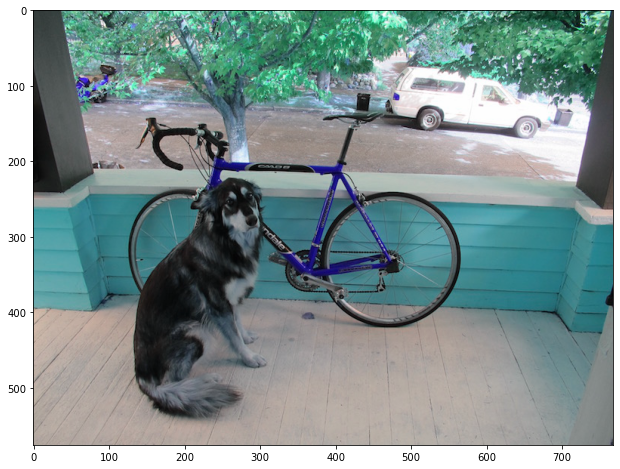

In [115]:
plt.imshow(img)

hmm..If we compare this to the original image, looks the the Red , Blue, Green colors are a bit interchanged. 

#### That's because open cv reads an image as BGR, where originally it is RGB. So, we now need to convert it back to RGB form

# Using numpy to get RGB

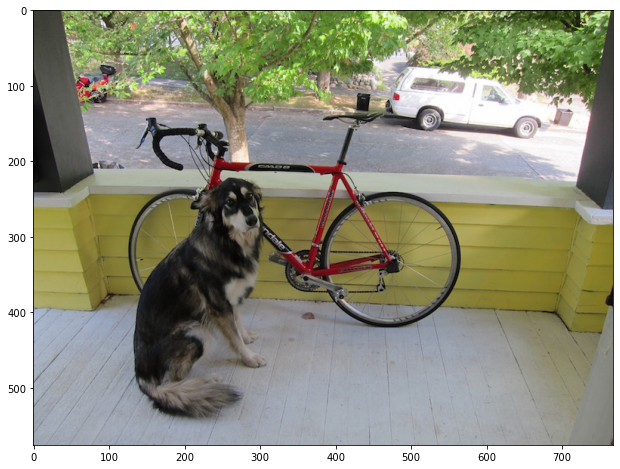

In [116]:
# split the bgr values 
b,g,r = img[:,:,0], img[:,:,1], img[:,:,2]

# make a new numpy array 
rgb_numpy = np.zeros(img.shape)

# add channels in the new array as we require 
rgb_numpy[:,:,0], rgb_numpy[:,:,1], rgb_numpy[:,:,2] = r , g, b 

# make sure the shape is (576,768,3)
# print(rgb_numpy.shape)

# show the image 
plt.imshow(rgb_numpy.astype(int)) # Converting it to int, as otherwise it considers 
                                  # it as float and clips the values between 0 to 1 

# using Open CV

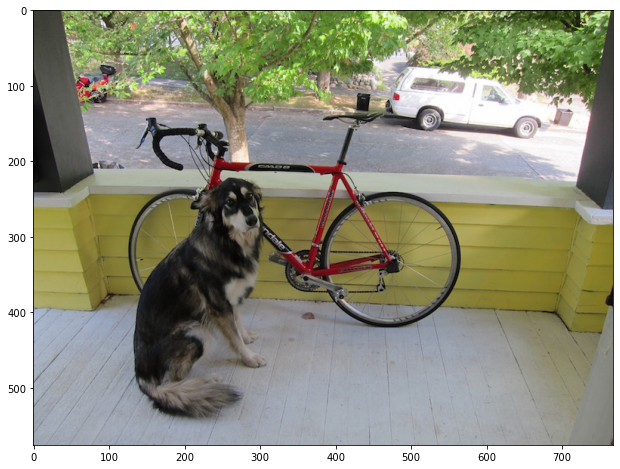

In [117]:
# its easy using a library (open cv)
rgb_cv = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# showing the image 
plt.imshow(rgb_cv)

In [118]:
# save rgb to img
img = rgb_cv

# Effect of each channel of the image

To see how R, G, B channel contribute to the final image, we can see how the image would look like if we remove a channel 

In [119]:
def remove_channel(img,channel):
    '''
    INPUT - 
        img - image from which we  will make pixel values for a particular channel 0
        channel - 0 for red, 1 for green, 2 for blue 
    OUTPUT - 
        temp - image in which a given channel has 0 pixel value 
    '''
    temp = np.copy(img)
    temp[:,:,channel] = 0
    return temp

In [120]:
img_no_red = remove_channel(img,0)
img_no_green = remove_channel(img,1)
img_no_blue = remove_channel(img,2)

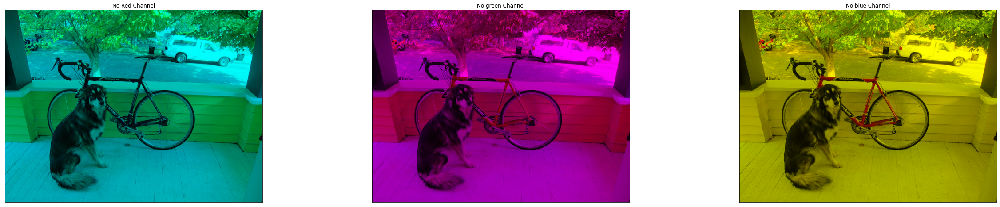

In [122]:
fit,ax = plt.subplots(1,3,figsize = (42,8))
ax[0].imshow(img_no_red)
ax[0].set_title('No Red Channel')
ax[1].imshow(img_no_green)
ax[1].set_title('No green Channel')
ax[2].imshow(img_no_blue)
ax[2].set_title('No blue Channel')
for i in range(3):
    ax[i].set_xticks([])
    ax[i].set_yticks([])

## The above images are a bit small. To get more insight ,an image with no REDness in it would look some thing like - 
### Only blue and green channel are contributing to this image

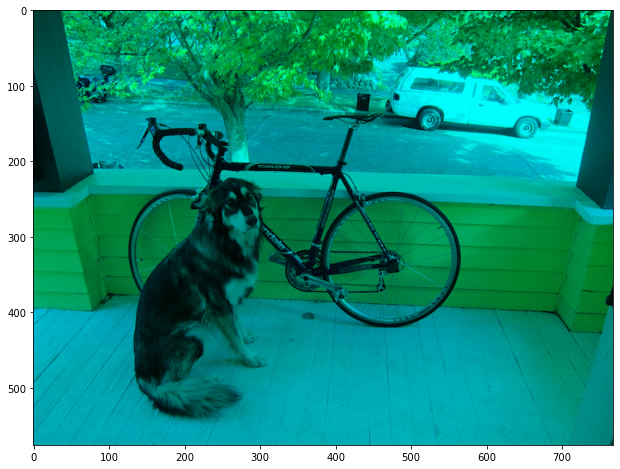

In [123]:
plt.imshow(img_no_red)

Suppose a person can;t see red color, then this is how he would percieve this image. 

## NO - Green
An image with no GREENness...

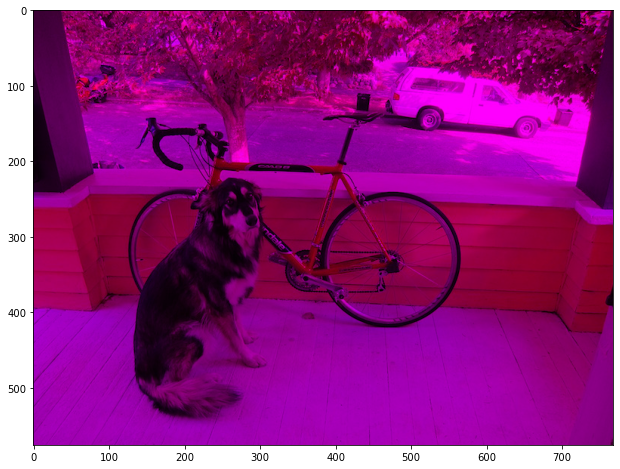

In [124]:
plt.imshow(img_no_green)

The above image kind of hurt our eyes, that's because we have removed green, the part which we are more sensitive and used to. 

# Converting to GrayScale

Now, we are interested in converting RGB to Grayscale, so the final image will have only 1 channel instead of 3. This will result in a 2-D Matrix

So, how would we convert a 3-D Matrix (or tensor) to a 2-D. 
One thing we can do is simply for each pixel, we take the mean of the values, and consider it as the value of grayscale pixel

(576, 768)


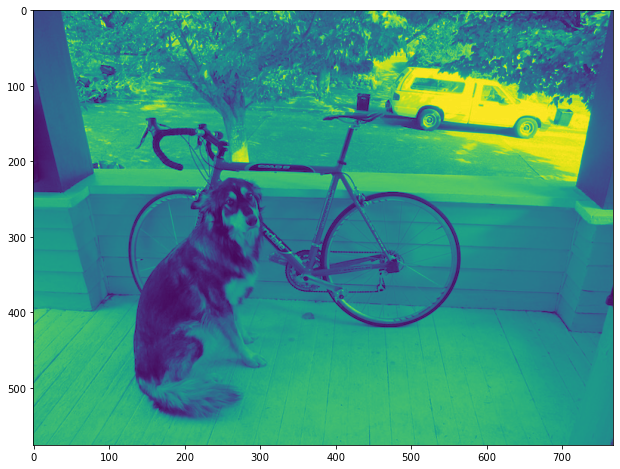

In [125]:
gray_mean = np.mean(img,axis = 2)
print(gray_mean.shape)
plt.imshow(gray_mean)

The above image is a 2-D image, (see the gray_mean.shape)
<br> In this case we are considering that Red Green and Blue channel each have same contribution to the final representation (33%), but this is not true when it comes to real world. 

In real world we are more sensitive to green, then red, least for blue 

![sensitivity.png](data/sensitivity.png)

Therefore green will have more contribution to the grey scale, followed by red , and then blue 

## Converting to grayscale using numpy 

In real world, green contributes to about 58% to gray scale, red 30%, and blue 11 % (simplified numbers)

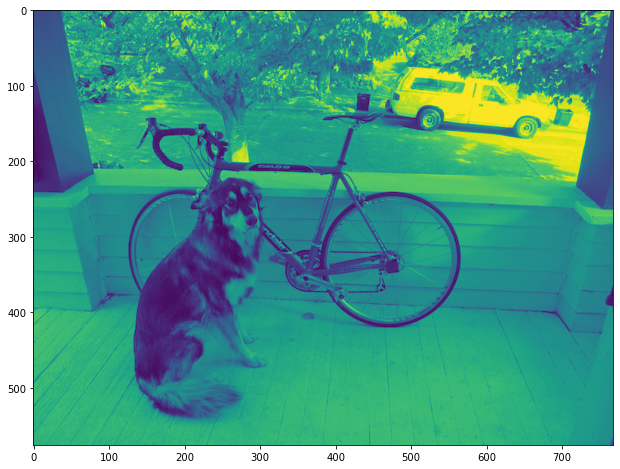

In [126]:
r, g, b = img[:,:,0], img[:,:,1], img[:,:,2]
gray = 0.2989 * r + 0.5870 * g + 0.1140 * b

plt.imshow(gray)

# Converting using open CV

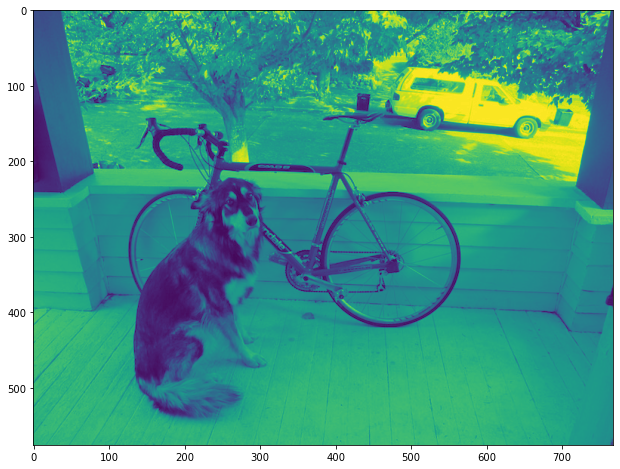

In [127]:
gray_cv = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)

plt.imshow(gray_cv)

# Shifting the image colors

In [128]:
# lets first of all convert images to float numbers from 0 to 1 
img = img / 255.0 

Now let's write a function to add a constant factor to a channel in an image. We can use this across every channel in the image to make the image brighter or darker. We could also use it to, say, shift an image to be more or less of a given color.

In [129]:
def shift_img(img, channel, change):
    temp = np.copy(img)
    if change > 0:
        temp[:,:,channel] += temp[:,:,channel]*change
    else:
        temp[:,:,channel] -= temp[:,:,channel]*np.abs(change)
    
    temp = np.clip(temp,0,1)
    return temp

In [130]:
def plot_2_images(image1,image2,label1,label2):
    fig,ax = plt.subplots(1,2)
    ax[0].imshow(image1)
    ax[1].imshow(image2)
    ax[0].axis('off')
    ax[1].axis('off')
    ax[0].set_title(label1)
    ax[1].set_title(label2)

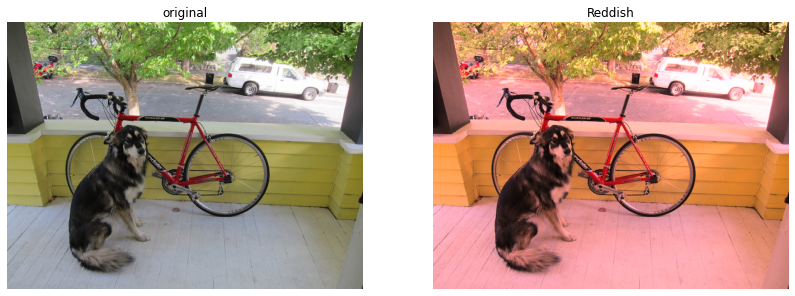

In [131]:
# increase the red concentration by 60 %
reddish = shift_img(img,0,0.6)

plot_2_images(img,reddish,'original','Reddish')

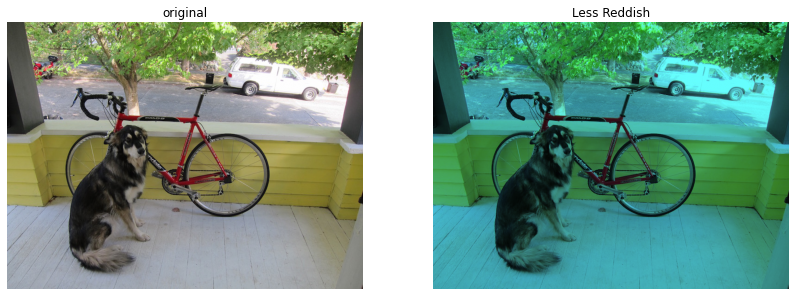

In [132]:
# decrease the red concentration by 60%
less_reddish = shift_img(img,0,-0.6)

plot_2_images(img,less_reddish,'original','Less Reddish')

# From RGB to HSV

So, far we were only dearling with the RGB images. To revise it, RGB image has three channels, (r,g,b), each channel represents the contest of the color. 
ie red channel represents the contribution of red color of a given pixel. <br> 
The RGB can be represented as a cube, so, the first channel has value from 0 to 255, similarly the second and third channel (sides of cube)

![convert.png](data/convert.png)

On the other hand, the HSV (hue, Saturation, value) also contains three channels, but these three channel represent Hue, Saturation and Value respectively. <br> <br>
Lets look at what does this mean - 
- Hue: Takes the value of angle, selects the color type. For different value, we get a different color.
- Saturation: Takes the value of radius, from centre to the boundary. The color is white at centre, and becomes more as hue as it moves away. 
- Value: Takes the value of height. As value is low, (lower region) the color is dark, and the contrast of the color increases as value increases

## Converting rgb to hsv using open cv

In [145]:
# converting rgb to hsv using numpy arrays is kind of complex, we will instead use a built in func
img_rgb = cv2.cvtColor(orig_img,cv2.COLOR_BGR2RGB)
img_hsv = cv2.cvtColor(img_rgb,cv2.COLOR_RGB2HSV)

due to some reason (which i don't know), i was not able to convert the img to hsv, hence i used the orig one, also, remember its in BGR format, so BGR2HSV is used instead of RGB2HSV

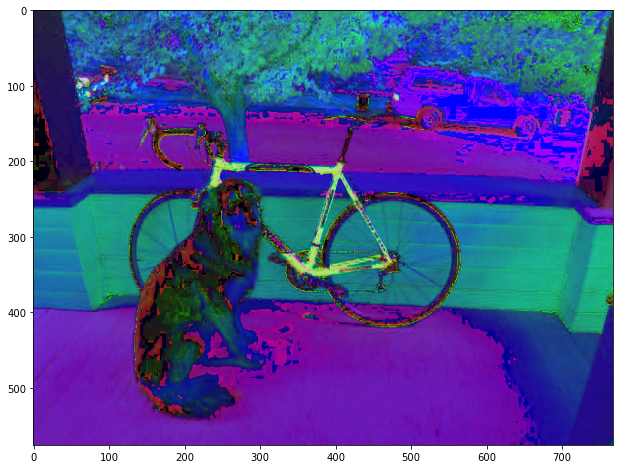

In [161]:
# so now lets see the hsv image 
plt.imshow(img_hsv)

The above image looks messy, that's because, plt.imshow considers the entered image to be of RGB format. So, it assumes the three channels to be RGB, whereas they are HSV. <br>
<br> 
So, to view our hsv imgage, we will first convert it to RGB and then use plt.imshow

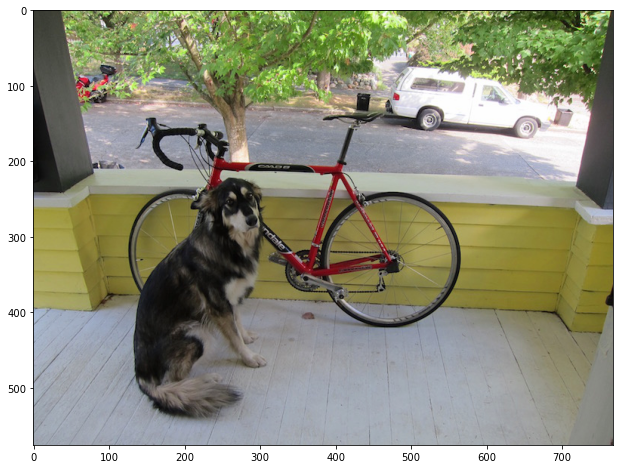

In [162]:
img_rgb2 = cv2.cvtColor(img_hsv,cv2.COLOR_HSV2RGB)
plt.imshow(img_rgb2)

## Why HSV?

As we saw above we are not even able to show hsv image, and converting it to RGB to view it. But why take all the trouble then.... <br> 
Well, that's because RGB allows us work with three channels, (r,g,b), and changing the values of the particular channel we can change the concentration of red, blue and green channels. 
<br> <br>
But, lets suppose I want to play around with the contrast of colors, or the saturation of colors, or i want to see how my image look if color theme was changes, 
####  That's where HSV comes into picture

## Lets see the channels separately

In [198]:
# before that, lets make a funcitons that will make our lives easier
def shift_hsv_img(img,channel,change):
    temp = np.copy(img)
    if change > 0:
        temp[:,:,channel] = temp[:,:,channel] + temp[:,:,channel]*change
    else:
        temp[:,:,channel] =temp[:,:,channel] -  temp[:,:,channel]*np.abs(change)
    
    if channel == 0:
        temp = np.clip(temp,0,179)
    else:
        temp = np.clip(temp,0,255)
        
    return cv2.cvtColor(temp,cv2.COLOR_HSV2RGB)

- ## HUE

Hue ranges from 0 to 179 and from the cylindrical figure we can see that it decides which shade of the color is being used.

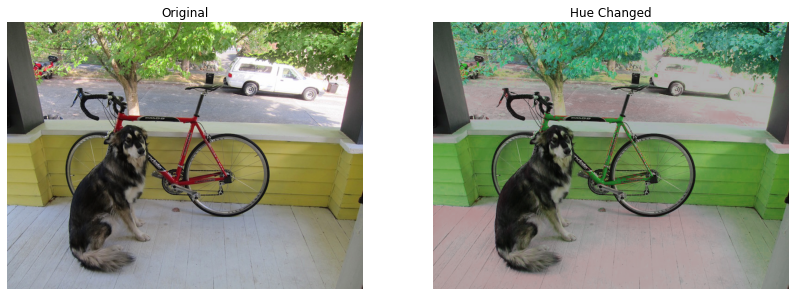

In [356]:
# lets increase the hue and change the differnce

inc_hue = shift_hsv_img(img_hsv,0,0.8)
dec_hue = shift_hsv_img(img_hsv,0,-0.8)

plot_2_images(img_rgb,inc_hue,'Original','Hue Changed')

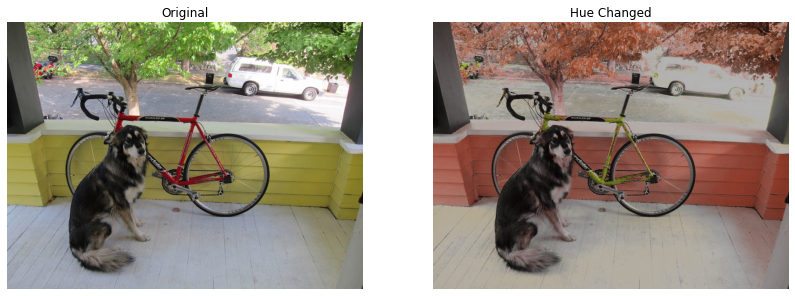

In [357]:
plot_2_images(img_rgb,dec_hue,'Original','Hue Changed')

Note: Although we have changed hue, Saturation and Value are same, that is why we are seeing changes only where saturation and value is high. 

## Setting a constant value for HUE

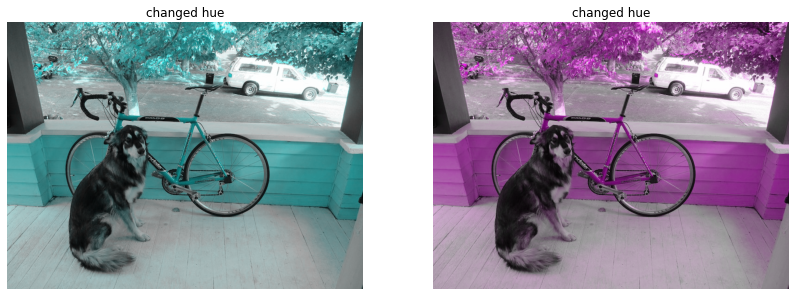

In [378]:
# random hue 
temp1 = np.copy(img_hsv)
temp1[:,:,0] = 90
temp_rgb1 = cv2.cvtColor(temp1,cv2.COLOR_HSV2RGB)

temp2 = np.copy(img_hsv)
temp2[:,:,0] = 150
temp_rgb2 = cv2.cvtColor(temp2,cv2.COLOR_HSV2RGB)

plot_2_images(temp_rgb1,temp_rgb2,'changed hue','changed hue')

- ## Saturation

From the cylindrical figure, we can see that saturation decides the amount of white mixed with hue. The value ranges from 0 to 255
<br> <br> 
Inreasing Saturation means going away from the centre, and decreasing saturation means going towards the centre

### Minimum and maximum saturation

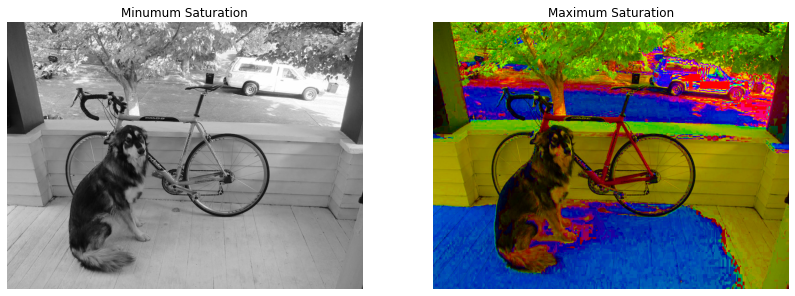

In [387]:
temp1 = np.copy(img_hsv)
temp1[:,:,1] = 0
temp_rgb1 = cv2.cvtColor(temp1,cv2.COLOR_HSV2RGB)

temp2 = np.copy(img_hsv)
temp2[:,:,1] = 255
temp_rgb2 = cv2.cvtColor(temp2,cv2.COLOR_HSV2RGB)

plot_2_images(temp_rgb1,temp_rgb2,'Minumum Saturation','Maximum Saturation')

We can get some idea about what saturation does by looking the above two pictures

### Increasing saturation

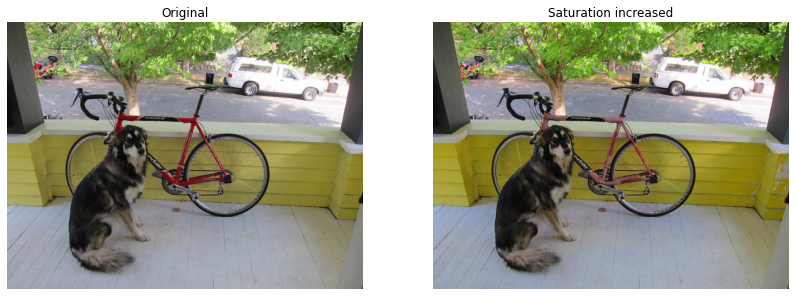

In [393]:
inc_sat = shift_hsv_img(img_hsv,1,0.4)

plot_2_images(img_rgb,inc_sat,'Original','Saturation increased')

By increasing the saturation, we are getting more contrast images. 

- ## Value

Value corresponds to the height of the cylinder, its value varies from 0 to 255. It mainly controls the intensity of each color 
<br> <br> 
The changes can be visualized as going up the cylinder when value is increasing , and going down when its decreasing

## Min and max value

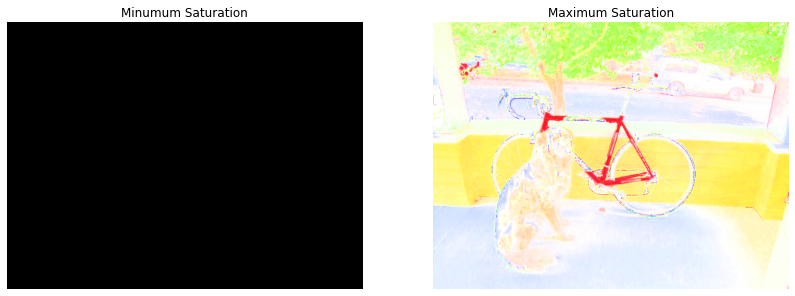

In [394]:
temp1 = np.copy(img_hsv)
temp1[:,:,2] = 0
temp_rgb1 = cv2.cvtColor(temp1,cv2.COLOR_HSV2RGB)

temp2 = np.copy(img_hsv)
temp2[:,:,2] = 255
temp_rgb2 = cv2.cvtColor(temp2,cv2.COLOR_HSV2RGB)

plot_2_images(temp_rgb1,temp_rgb2,'Minumum Saturation','Maximum Saturation')

The first image is totally black, and well, that's expected, just see how the points are at the bottom of the cylinder. 

NOTE: we never use the extreme cases in real world, they are just to get a sense of what's going on. 

## increasing value 

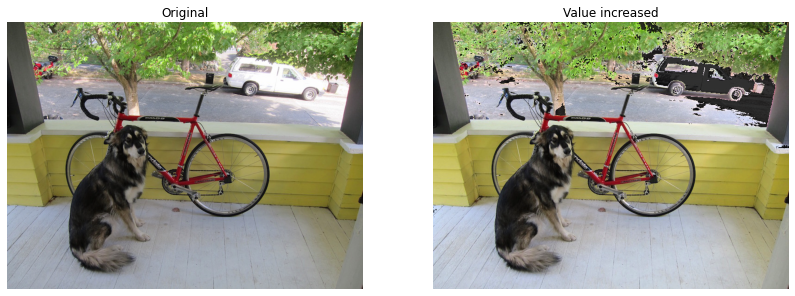

In [399]:
inc_val = shift_hsv_img(img_hsv,2,0.2)

plot_2_images(img_rgb,inc_val,'Original','Value increased')

The brightness increased....but observe the upper right portion

# Some fun ammendments

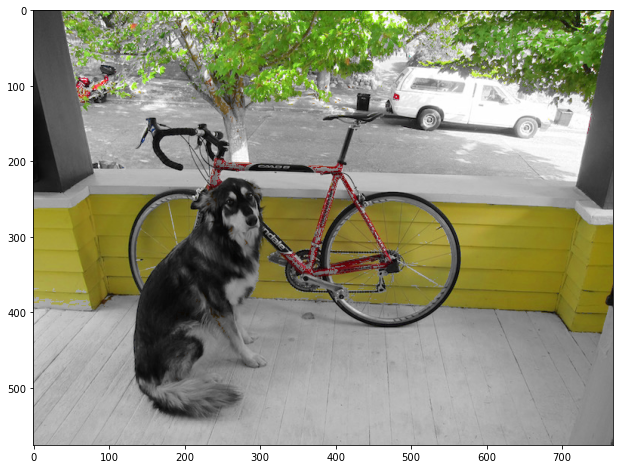

In [415]:
temp1 = np.copy(img_hsv)
sat = temp1[:,:,1]
sat += 40
sat = np.where(sat > 140,sat,0)
temp1[:,:,1] = sat
temp_rgb1 = cv2.cvtColor(temp1,cv2.COLOR_HSV2RGB)

plt.imshow(temp_rgb1)

# The above image is having either the bright colors, or the grayscale values

# THe last one - 

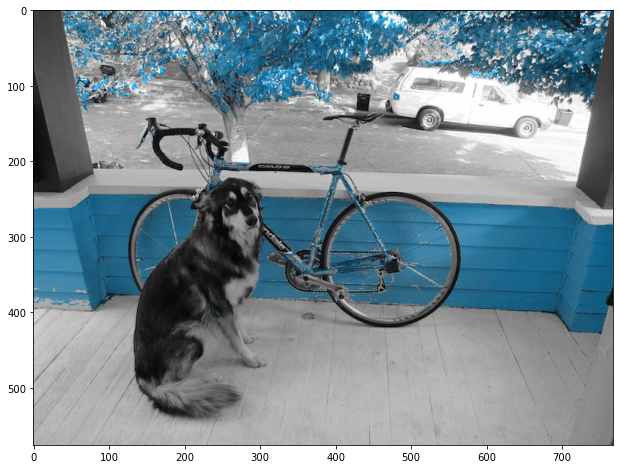

In [417]:
temp1 = np.copy(img_hsv)
sat = temp1[:,:,1]
sat += 40
sat = np.where(sat > 140,sat,0)
temp1[:,:,1] = sat
temp1[:,:,0] = 100
temp_rgb1 = cv2.cvtColor(temp1,cv2.COLOR_HSV2RGB)

plt.imshow(temp_rgb1)